<h1><center>CSCI - 6409 - The Process of Data Science - Summer 2022</center></h1>

<h1><center>Assignment 1</center></h1>



<b>Harshit Lakhani</b>

<b>B00887087</b>




<b>Aditya Mahale</b>

<b>B00867619</b>

In [1]:
!pip install tqdm

In [2]:
# Library imports
import pandas as pd
import warnings
import numpy as np

# Visualization libraries
import seaborn as sns
import matplotlib.pyplot as plt
from xgboost import plot_tree

# Geographical visualization library
import folium
from folium.plugins import HeatMap
from folium.plugins import HeatMapWithTime
from folium import plugins

# Modelling and preprocessing library
from sklearn import preprocessing
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression
from sklearn.neighbors import KNeighborsRegressor
import xgboost as xg

from sklearn import set_config
from sklearn.model_selection import train_test_split

# Evaluation metrics
from sklearn.metrics import mean_squared_error as MSE
from sklearn.metrics import mean_absolute_error as MAE
from sklearn.metrics import r2_score as R2

from tqdm import tqdm
import datetime

import scipy

In [3]:
# Prerequisites
# Ignoring Warnings
warnings.filterwarnings('ignore')
set_config(print_changed_only=False)
# Set figure size to 20 X 10
plt.figure(figsize=(20, 10))

# Set SNS plots figure size to 15 X 15
sns.set(rc={'figure.figsize': (15, 15)})

# Set options to avoid truncation when displaying a dataframe
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

# Set floating point numbers to be displayed with 2 decimal places
pd.set_option('display.float_format', '{:.5f}'.format)

# Setting plot font parameters
font_label = {'family': 'serif','color':  'darkred','weight': 'normal','size': 16,}
font_title = {'family': 'serif','color':  'darkred','weight': 'bold','size': 22,}

<Figure size 1440x720 with 0 Axes>

<h2>1. Data Exploration and preprocessing</h2>
<p style="font-size: 18px">There are four different files in this dataset divided by years. In the upcoming code blocks, we will combine the files in a data frame for data exploration and preprocessing.</p>

In [4]:
# Loading the file datasets into four dataframes
df_2017 = pd.read_csv("../input/australia-and-investigative-special-wildfires-data/INVESTIGATION SPECIAL COORDINATES/AUSTRALIA/modis_2017_Australia.csv")
df_2018 = pd.read_csv("../input/australia-and-investigative-special-wildfires-data/INVESTIGATION SPECIAL COORDINATES/AUSTRALIA/modis_2018_Australia.csv")
df_2019 = pd.read_csv("../input/australia-and-investigative-special-wildfires-data/INVESTIGATION SPECIAL COORDINATES/AUSTRALIA/modis_2019_Australia.csv")
df_2020 = pd.read_csv("../input/australia-and-investigative-special-wildfires-data/INVESTIGATION SPECIAL COORDINATES/AUSTRALIA/modis_2020_Australia.csv")

# Combining all the dataframes in a single dataframe
df = pd.concat([df_2017, df_2018, df_2019, df_2020])

# Resetting the index after combining the data frames
df.reset_index(drop=True, inplace=True)

### 1.1 Data Quality Report

#### 1.1.a. Generate data quality reports for the continuous and the categorical features of the data set

In [5]:
# Summarizing the data types and the number of records available in each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1046679 entries, 0 to 1046678
Data columns (total 15 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   latitude    1046679 non-null  float64
 1   longitude   1046679 non-null  float64
 2   brightness  1046679 non-null  float64
 3   scan        1046679 non-null  float64
 4   track       1046679 non-null  float64
 5   acq_date    1046679 non-null  object 
 6   acq_time    1046679 non-null  int64  
 7   satellite   1046679 non-null  object 
 8   instrument  1046679 non-null  object 
 9   confidence  1046679 non-null  int64  
 10  version     1046679 non-null  float64
 11  bright_t31  1046679 non-null  float64
 12  frp         1046679 non-null  float64
 13  daynight    1046679 non-null  object 
 14  type        1046679 non-null  int64  
dtypes: float64(8), int64(3), object(4)
memory usage: 119.8+ MB


* <p style="font-size: 18px">There are 15 columns and none of them have any missing values.</p>
* <p style="font-size: 18px">Some of the features are of type object. It cannot be used in preprocessing data and model training. So, we will convert those types to the relevant data types using the in built convert_dtypes method.</p>

In [6]:
# Displaying summary after converting data types
df = df.convert_dtypes()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1046679 entries, 0 to 1046678
Data columns (total 15 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   latitude    1046679 non-null  Float64
 1   longitude   1046679 non-null  Float64
 2   brightness  1046679 non-null  Float64
 3   scan        1046679 non-null  Float64
 4   track       1046679 non-null  Float64
 5   acq_date    1046679 non-null  string 
 6   acq_time    1046679 non-null  Int64  
 7   satellite   1046679 non-null  string 
 8   instrument  1046679 non-null  string 
 9   confidence  1046679 non-null  Int64  
 10  version     1046679 non-null  Float64
 11  bright_t31  1046679 non-null  Float64
 12  frp         1046679 non-null  Float64
 13  daynight    1046679 non-null  string 
 14  type        1046679 non-null  Int64  
dtypes: Float64(8), Int64(3), string(4)
memory usage: 130.8 MB


In [7]:
# Displaying the first row of the data to better understand the data instance
df.loc[0]

latitude       -23.90830
longitude      147.29660
brightness     320.10000
scan             1.70000
track            1.30000
acq_date      2017-01-01
acq_time              47
satellite          Terra
instrument         MODIS
confidence            53
version          6.20000
bright_t31     296.60000
frp             17.60000
daynight               D
type                   0
Name: 0, dtype: object

In [8]:
# Custom function to create the continuous feature report
def build_continuous_features_report(data_df):
    
    """Build tabular report for continuous features"""

    stats = {
        "Count": len,
        "Miss %": lambda df: df.isna().sum() / len(df) * 100,
        "Card.": lambda df: df.nunique(),
        "Min": lambda df: df.min(),
        "1st Qrt.": lambda df: df.quantile(0.25),
        "Mean": lambda df: df.mean(),
        "Median": lambda df: df.median(),
        "3rd Qrt": lambda df: df.quantile(0.75),
        "Max": lambda df: df.max(),
        "Std. Dev.": lambda df: df.std(),
    }

    contin_feat_names = data_df.select_dtypes("number").columns
    continuous_data_df = data_df[contin_feat_names]

    report_df = pd.DataFrame(index=contin_feat_names, columns=stats.keys())

    for stat_name, fn in stats.items():
        # NOTE: ignore warnings for empty features
        with warnings.catch_warnings():
            warnings.simplefilter("ignore", category=RuntimeWarning)
            report_df[stat_name] = fn(continuous_data_df)

    return report_df


In [9]:
# Preliminary statistics for the continuous features
build_continuous_features_report(df)

,Count,Miss %,Card.,Min,1st Qrt.,Mean,Median,3rd Qrt,Max,Std. Dev.
latitude,1046679,0.00000,259382,-43.50060,-28.77290,-21.95891,-19.92190,-15.30320,-9.24630,7.78563
longitude,1046679,0.00000,325532,113.12940,126.80485,135.25296,133.14480,144.96105,153.59190,10.51687
brightness,1046679,0.00000,2050,300.00000,317.90000,332.88192,328.70000,341.60000,507.00000,23.10974
scan,1046679,0.00000,39,1.00000,1.10000,1.66498,1.30000,1.90000,4.80000,0.85488
track,1046679,0.00000,11,1.00000,1.00000,1.22804,1.10000,1.40000,2.00000,0.25816
acq_time,1046679,0.00000,855,0.00000,225.00000,622.02228,444.00000,629.00000,2359.00000,532.03785
confidence,1046679,0.00000,101,0.00000,56.00000,71.06028,74.00000,90.00000,100.00000,22.92438
version,1046679,0.00000,2,6.03000,6.03000,6.07439,6.03000,6.20000,6.20000,0.07467
bright_t31,1046679,0.00000,972,265.70000,295.90000,303.23415,303.00000,309.80000,400.10000,10.72635
frp,1046679,0.00000,13993,-29.90000,14.60000,70.50157,28.60000,63.50000,11164.10000,169.46749


### Initial Observations

* <p style="font-size: 18px">We can see that in the numerical data columns, there are no missing values</p>
* <p style="font-size: 18px">We can say that the columns type, version, track are categorical features as because the cardinality is less than 10</p>


In [10]:
# Custom function to create the categorical feature report
def build_categorical_features_report(data_df):

    """Build tabular report for categorical features"""

    def _mode(df):
        return df.apply(lambda ft: ft.mode().to_list()).T

    def _mode_freq(df):
        return df.apply(lambda ft: ft.value_counts()[ft.mode()].sum())

    def _second_mode(df):
        return df.apply(lambda ft: ft[~ft.isin(ft.mode())].mode().to_list())

    def _second_mode_freq(df):
        return df.apply(
            lambda ft: ft[~ft.isin(ft.mode())]
            .value_counts()[ft[~ft.isin(ft.mode())].mode()]
            .sum()
        )

    stats = {
        "Count": len,
        "Miss %": lambda df: df.isna().sum() / len(df) * 100,
        "Card.": lambda df: df.nunique(),
        "Mode": _mode,
        "Mode Freq": _mode_freq,
        "Mode %": lambda df: _mode_freq(df) / len(df) * 100,
        "2nd Mode": _second_mode,
        "2nd Mode Freq": _second_mode_freq,
        "2nd Mode %": lambda df: _second_mode_freq(df) / len(df) * 100,
    }

    cat_feat_names = data_df.select_dtypes(exclude="number").columns
    continuous_data_df = data_df[cat_feat_names]

    report_df = pd.DataFrame(index=cat_feat_names, columns=stats.keys())

    for stat_name, fn in stats.items():
        # NOTE: ignore warnings for empty features
        with warnings.catch_warnings():
            warnings.simplefilter("ignore", category=RuntimeWarning)
            report_df[stat_name] = fn(continuous_data_df)

    return report_df

In [11]:
# Preliminary statistics for the categorical features
build_categorical_features_report(df)

,Count,Miss %,Card.,Mode,Mode Freq,Mode %,2nd Mode,2nd Mode Freq,2nd Mode %
acq_date,1046679,0.00000,1461,2020-01-04,7351,0.70232,[2019-12-30],6925,0.66162
satellite,1046679,0.00000,2,Aqua,600236,57.34671,[Terra],446443,42.65329
instrument,1046679,0.00000,1,MODIS,1046679,100.00000,[],0,0.00000
daynight,1046679,0.00000,2,D,806375,77.04129,[N],240304,22.95871


### Initial Observations

* <p style="font-size: 18px">Instrument is a redundant feature as the cardinality is 1</p>

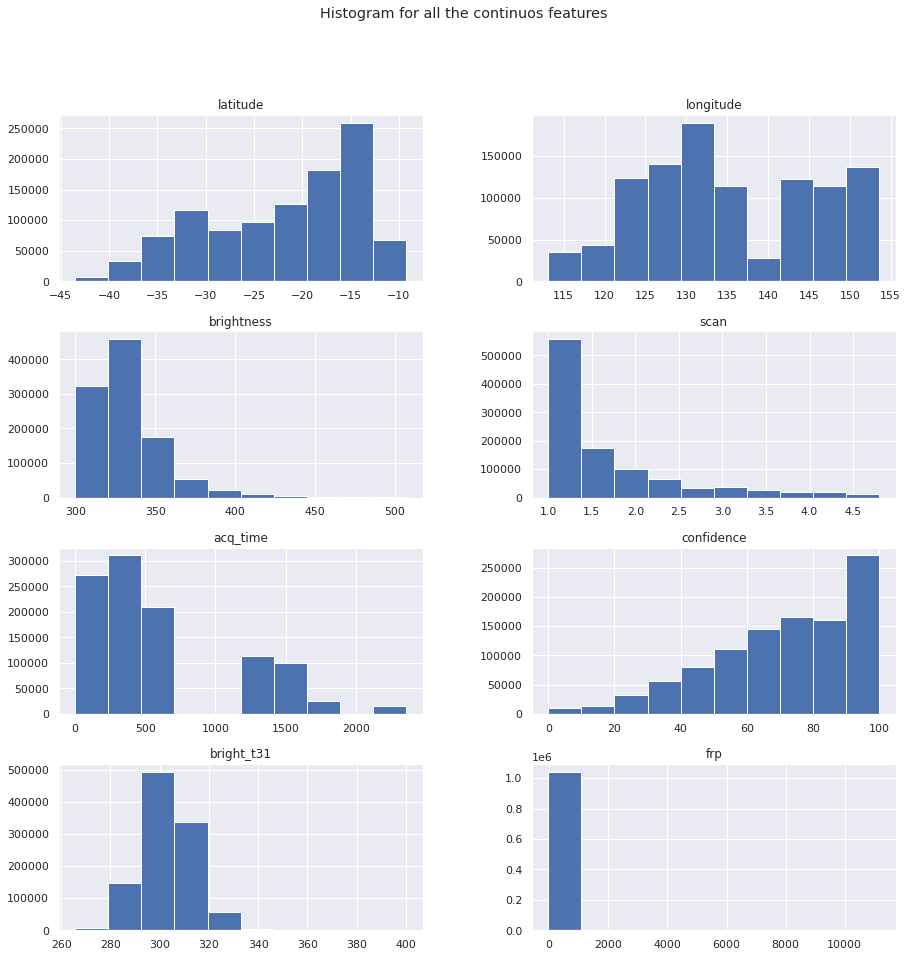

In [12]:
# Visualization

# Histograms of continuous features
# Choosing only numerical columns and columns where cardinality is greater than or equal to ten

df.hist(column=['latitude', 'longitude', 'brightness', 'scan', 'acq_time',  'confidence', 'bright_t31', 'frp'], layout=(4, 2));
plt.suptitle("Histogram for all the continuos features")
plt.show()

### Histogram Observations

* <p style="font-size: 18px">It can be seen that the brightness feature distribution is unimodal(skewed right)</p>
* <p style="font-size: 18px">The scan feature has an exponential distribution</p>
* <p style="font-size: 18px">The confidence feature has a skewed distribution</p>
* <p style="font-size: 18px">The FRP feature has an exponential distribution</p>

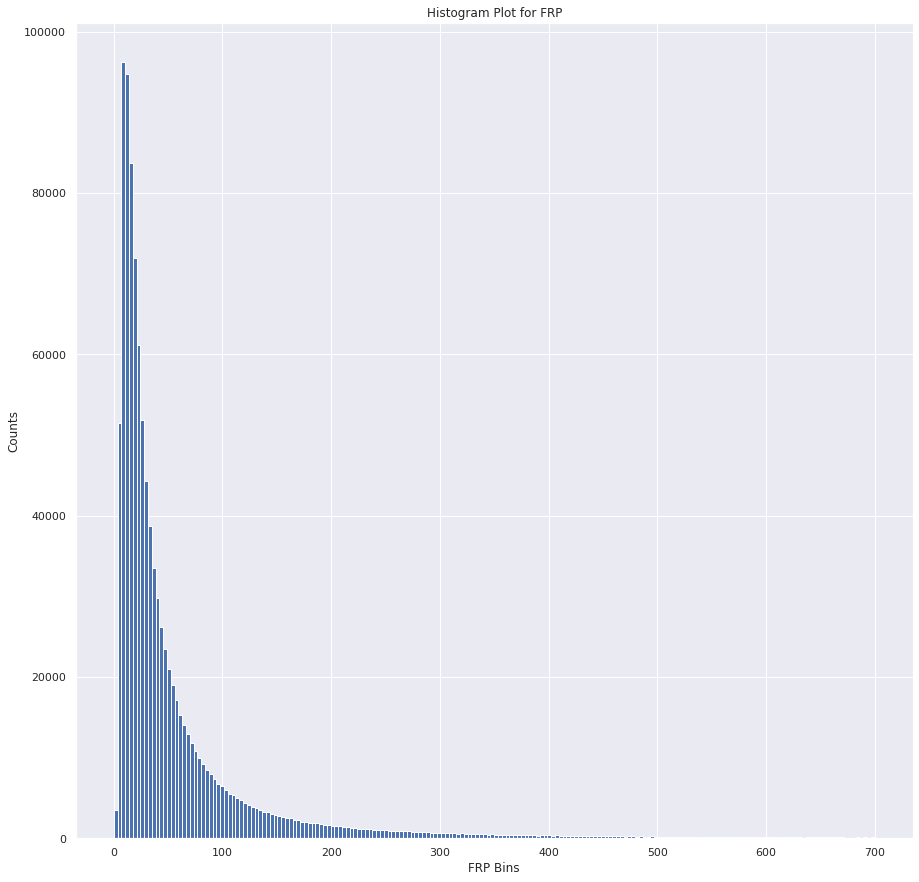

In [13]:
# Better visualization of the FRP histogram
df.hist(column=['frp'], bins=200, range=(0, 700))
plt.xlabel('FRP Bins')
plt.ylabel('Counts')
plt.title('Histogram Plot for FRP')
plt.show()

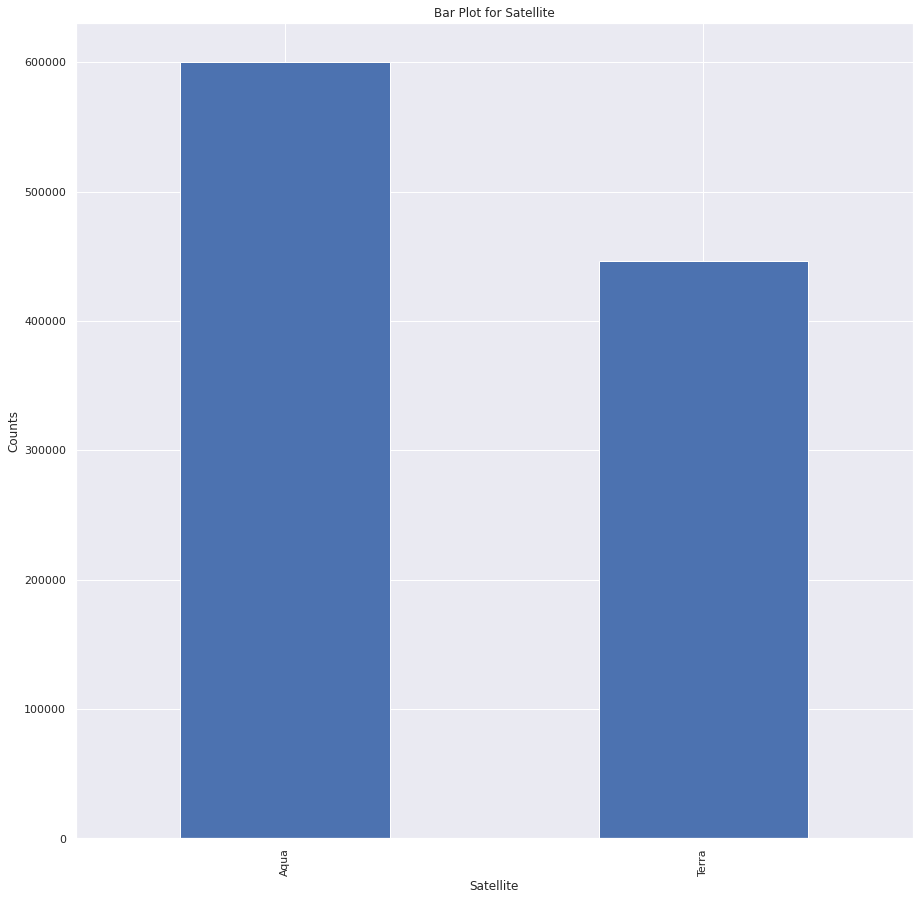

In [14]:
# Categorical Features Visualizations

# Satellite feature bar plot
df['satellite'].value_counts().plot.bar();
plt.xlabel('Satellite')
plt.ylabel('Counts')
plt.title('Bar Plot for Satellite')
plt.show()

### Satellite Bar Plot Observation
* <p style="font-size: 18px">The satellite categories are almost equally distributed</p>

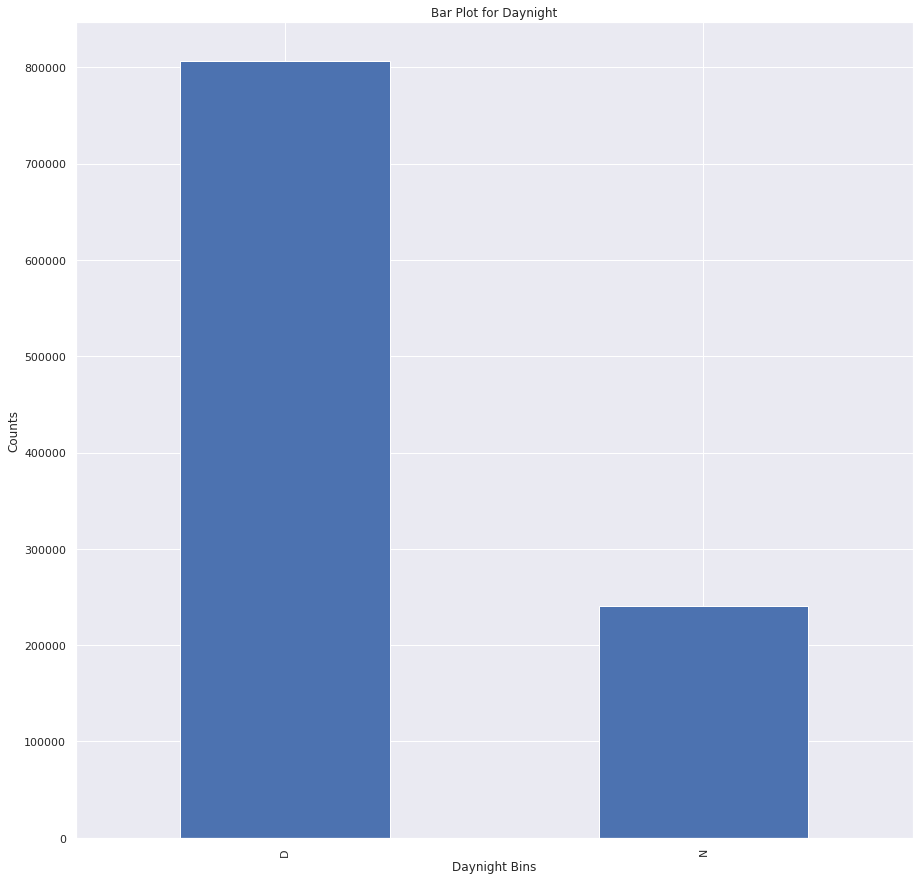

In [15]:
# Daynight feature bar plot
df['daynight'].value_counts().plot.bar();
plt.xlabel('Daynight Bins')
plt.ylabel('Counts')
plt.title('Bar Plot for Daynight')
plt.show()

### Daynight Bar Plot Observation
* <p style="font-size: 18px">The daynight feature has an unequal distribution</p>

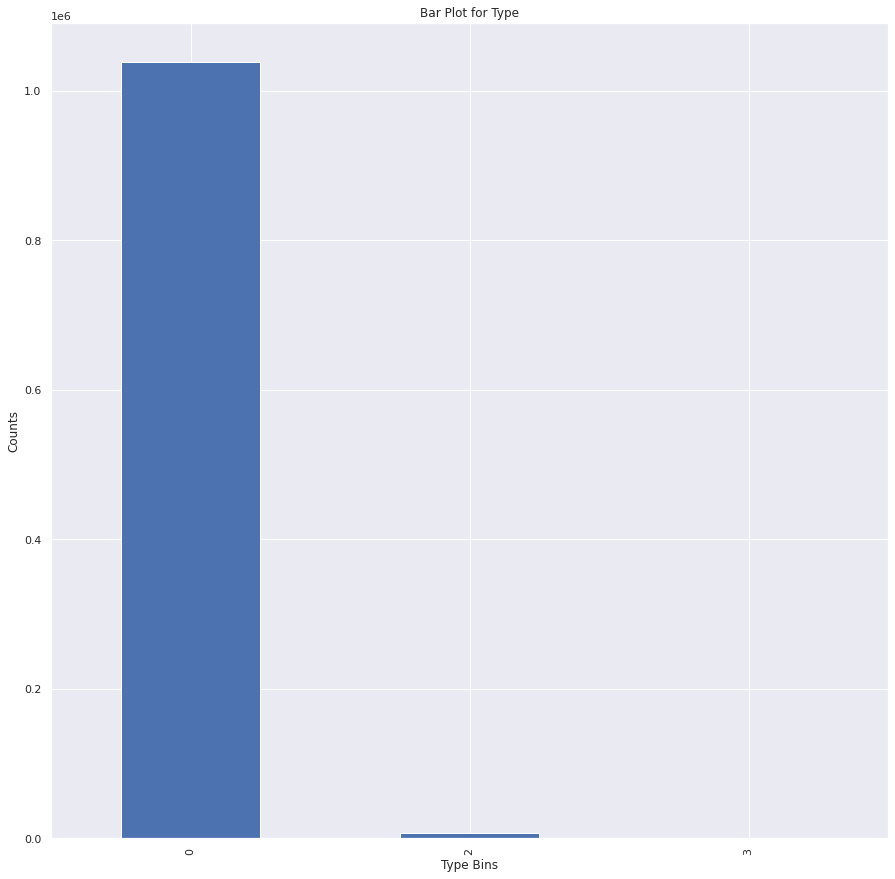

In [16]:
# Type feature bar plot
df['type'].value_counts().plot.bar()
plt.xlabel('Type Bins')
plt.ylabel('Counts')
plt.title('Bar Plot for Type')
plt.show()

### Type Bar Plot Observation
* <p style="font-size: 18px">The type feature has highly skewed data. Almost all data instances are of type 0</p>

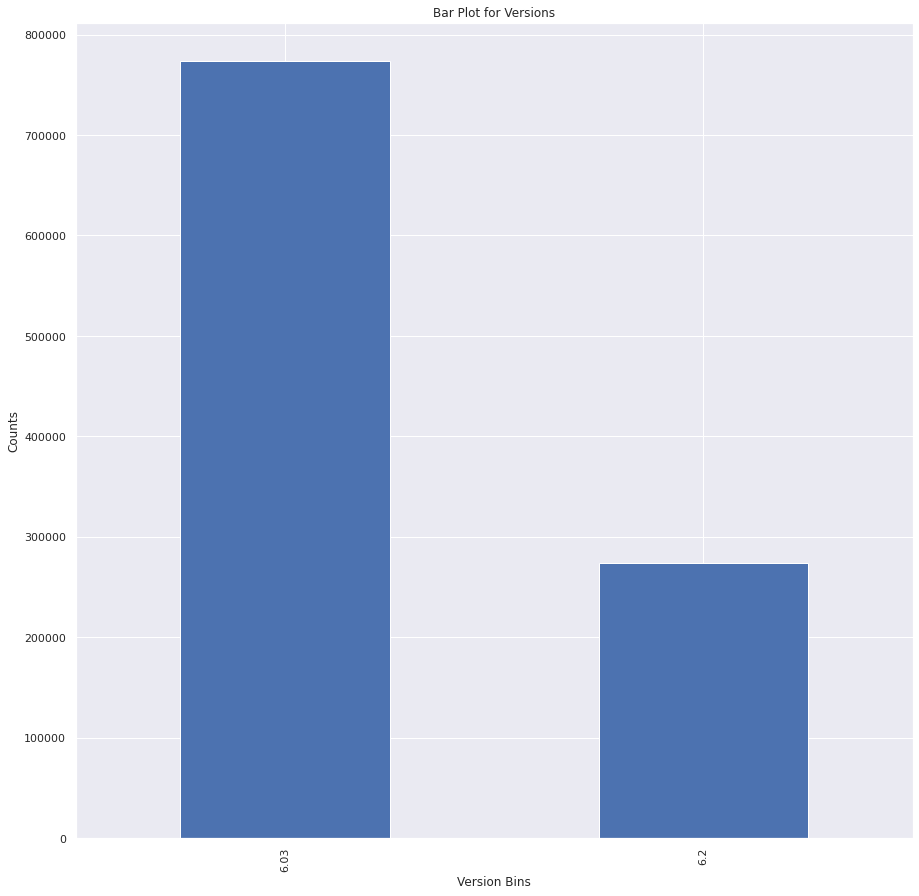

In [17]:
# Version feature bar plot
df['version'].value_counts().plot.bar();
plt.xlabel('Version Bins')
plt.ylabel('Counts')
plt.title('Bar Plot for Versions')
plt.show()

### Version Bar Plot Observation
* <p style="font-size: 18px">The version feature has an unequal distribution</p>

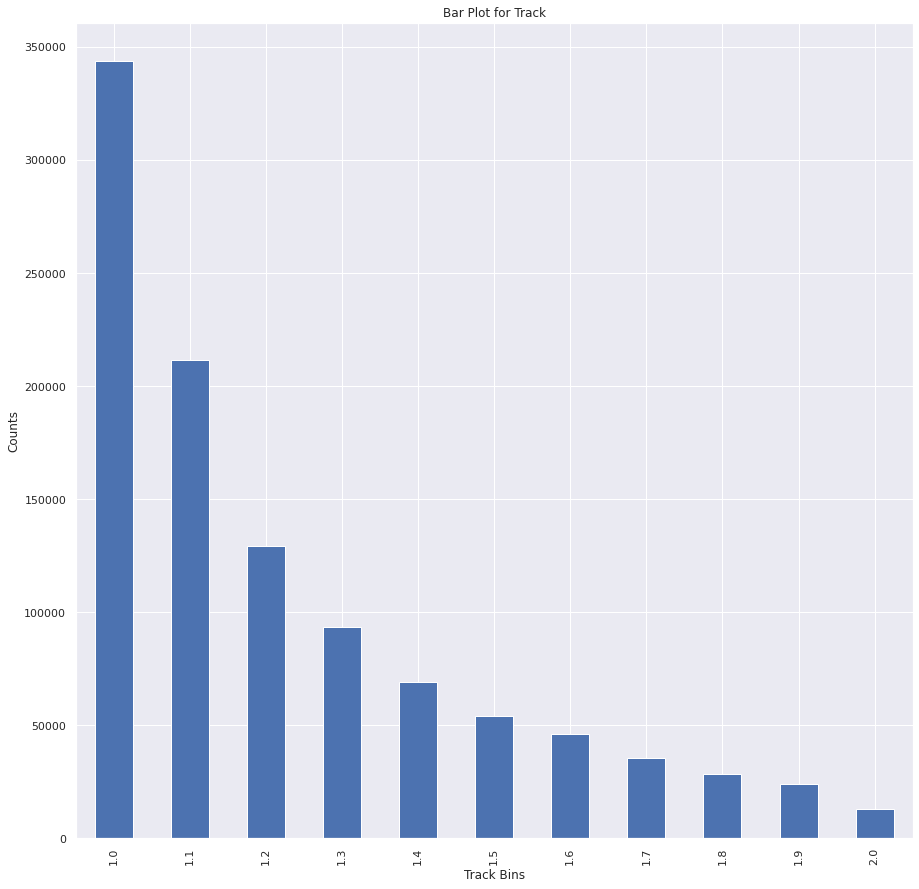

In [18]:
# Track feature bar plot
df['track'].value_counts().plot.bar();
plt.xlabel('Track Bins')
plt.ylabel('Counts')
plt.title('Bar Plot for Track')
plt.show()

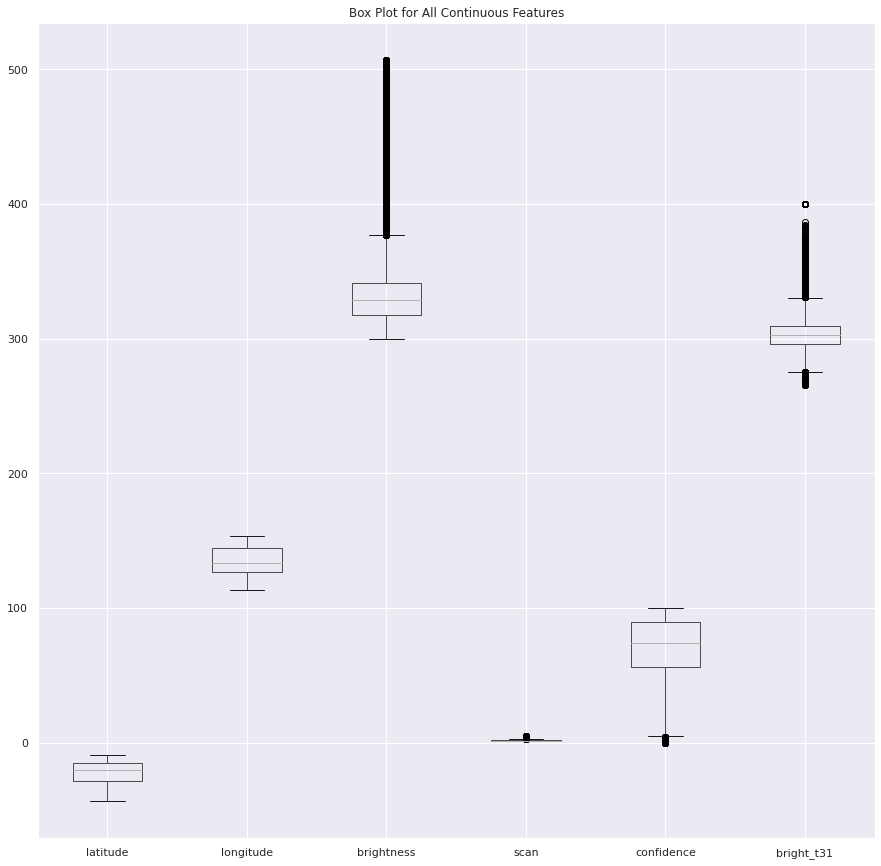

In [19]:
df.boxplot(['latitude', 'longitude', 'brightness', 'scan', 'confidence', 'bright_t31'])
plt.title('Box Plot for All Continuous Features')
plt.show()

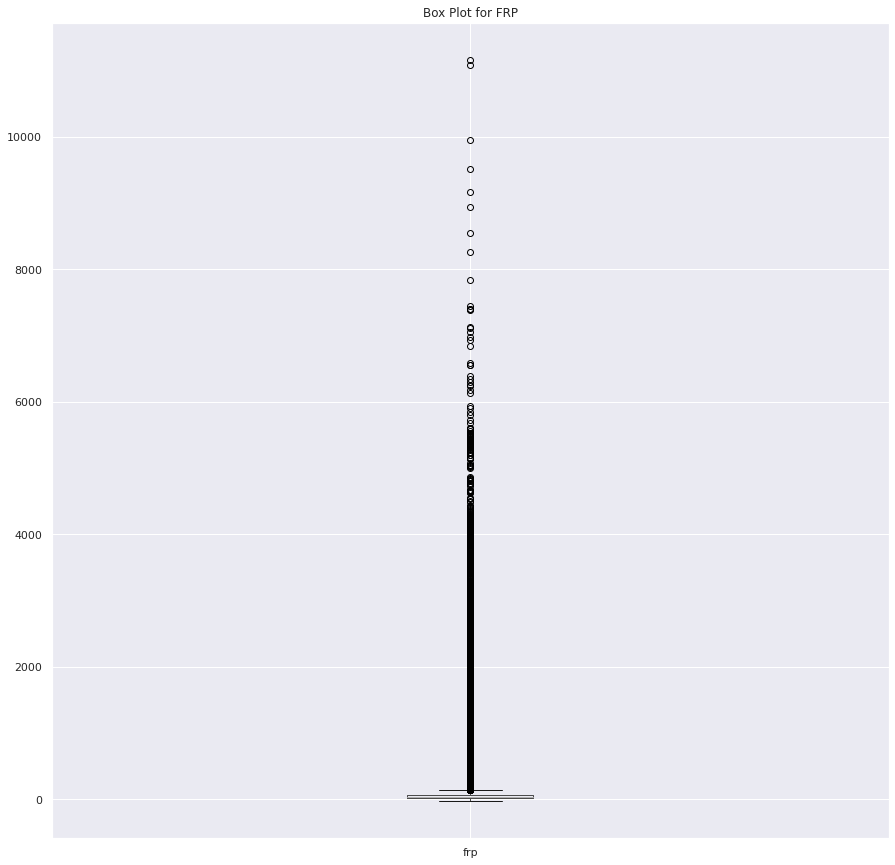

In [20]:
df.boxplot('frp')
plt.title('Box Plot for FRP')
plt.show()

### Box Plot Observations
<p style="font-size: 18px">The box plot shows that for the features such as brightness, brightness_t31 and FRP, the data is highly skewed and there are many outliers</p>

### 1.1.b Heatmap Correlation

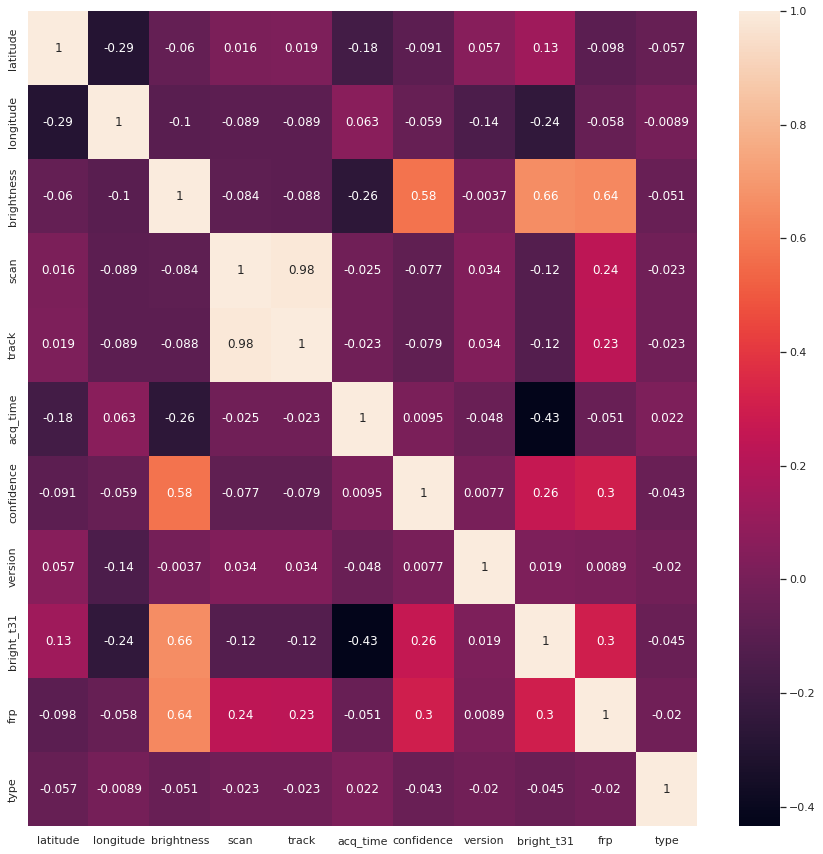

In [21]:
sns.heatmap(df.corr(), annot=True);

## Heatmap Initial Observations

1. <p style="font-size: 18px">Brightness and FRP are correlated with the confidence feature.</p>
2. <p style="font-size: 18px">Brightness and FRP are also correlated with each other.</p>
3. <p style="font-size: 18px">Although these correlations are not strong, the heatmap shows that there is some relations between the entities.</p>


### 1.1.c Data Quality Issues

1. <p style="font-size: 18px">There are no missing values in any of the features in the dataset. So, no action is required here.</p>
2. <p style="font-size: 18px">The instrument feature has only 1 unique value. Hence, it is a redundant feature.</p>
3. <p style="font-size: 18px">Type, version, and track are categorical features instead of continuous features.</p>
4. <p style="font-size: 18px">By looking at the box plots and the histograms, we can see that FRP, brightness, and brightness_t31 are highly skewed features.</p>
5. <p style="font-size: 18px">Categorical features are in numerical order. For example, the type has values like 0, 1, and 2. This categorical feature should be one hot encoded to give equal weightage to each class. Value has more weight compared to value 0. So, that will create a biased prediction.</p>

### 1.1.c Data Quality Plan

1. <p style="font-size: 18px">We are dropping the instrument column because it has a cardinality of 1. It will not add any new information while training the model.</p>
2. <p style="font-size: 18px">We are splitting the date column into two different columns of month and year because we think that there could a relation between bushfires with particular months of a year.</p>
3. <p style="font-size: 18px">Sampling: As the data is very huge, we want to pick samples from the data. We want to do stratified sampling based on the month and year. We are doing this to ensure that we get data from the monthly duration with equal weightage. We have 48 months in total and to have 150k records, we have to take 3200 samples from each month for every year. For the months which have insufficient records, we are oversampling the data till it becomes 3200.</p>
4. <p style="font-size: 18px">Models cannot work with a string value. To train the model, we will convert the string values into numerical values by using one-hot encoding.</p>

## 1.2 Preprocessing data according to the data quality plan

<p style="font-size: 18px">Dropping the instrument column because of cardinality 1</p>

In [22]:
df.drop(['instrument'], axis = 1, inplace = True)

<p style="font-size: 18px">Changing data type of acq_date from string to Datetime</p>

In [23]:
df["acq_date"] = pd.to_datetime(df["acq_date"], format="%Y-%m-%d").dt.date

<p style="font-size: 18px">Add new columns for year and month</p>

In [24]:
df["year"] = pd.DatetimeIndex(df["acq_date"]).year
df["month"] = pd.DatetimeIndex(df["acq_date"]).month

<p style="font-size: 18px">Sampling Data instances in each year</p>

In [25]:
df["year"].value_counts()

2019    310484
2018    307359
2017    273312
2020    155524
Name: year, dtype: int64

<p style="font-size: 18px">Minimum data is for 1st month of 2017. We have to upsample the data to atleast 3200 for each month. 153600 = 32008 * 12 (months) * 4 (years)</p>

In [26]:
df.groupby(["year", "month"]).size()

year  month
2017  1         2093
      2         3144
      3         9403
      4        18032
      5        32605
      6        23850
      7        13860
      8        22009
      9        45291
      10       29201
      11       42931
      12       30893
2018  1         8875
      2         3504
      3         8205
      4        33950
      5        41823
      6        20493
      7        19514
      8        18172
      9        27553
      10       52975
      11       44252
      12       28043
2019  1        23078
      2        13956
      3         9670
      4        13220
      5        17085
      6        18235
      7        21983
      8        16254
      9        19757
      10       28696
      11       47138
      12       81412
2020  1        36994
      2         6826
      3         4046
      4         7718
      5        15859
      6        13112
      7        16993
      8         6215
      9         8035
      10       11659
      11       21927
 

<p style="font-size: 18px">Group by (year + month) and randomly sample out 3200 records at max from each group</p>

In [27]:
stratified_year_month_data = df.groupby(['month','year'], group_keys=False).apply(lambda x: x.sample(min(len(x), 3200)))

In [28]:
stratified_data_group = stratified_year_month_data.groupby(["year", "month"])

<p style="font-size: 18px"> Checking if any group has less than 3200 records. In that case, it's randomly sampling the remaining records from that particular group</p>

In [29]:
samples = [stratified_year_month_data]
for index, group in stratified_data_group:
    samples.append(group.sample(3200-len(group)))


sampled_df = pd.concat(samples)

<p style="font-size: 18px">Counts after sampling</p>

In [30]:
sampled_df.groupby(["year", "month"]).size()

year  month
2017  1        3200
      2        3200
      3        3200
      4        3200
      5        3200
      6        3200
      7        3200
      8        3200
      9        3200
      10       3200
      11       3200
      12       3200
2018  1        3200
      2        3200
      3        3200
      4        3200
      5        3200
      6        3200
      7        3200
      8        3200
      9        3200
      10       3200
      11       3200
      12       3200
2019  1        3200
      2        3200
      3        3200
      4        3200
      5        3200
      6        3200
      7        3200
      8        3200
      9        3200
      10       3200
      11       3200
      12       3200
2020  1        3200
      2        3200
      3        3200
      4        3200
      5        3200
      6        3200
      7        3200
      8        3200
      9        3200
      10       3200
      11       3200
      12       3200
dtype: int64

<p style="font-size: 18px">One hot encoding for the type feature</p>

In [31]:
sampled_df = pd.get_dummies(sampled_df, columns=['type'])

<p style="font-size: 18px">Label encoding the daynight column(Because it is a categorical feature)</p>

In [32]:
label_encoder = preprocessing.LabelEncoder()

sampled_df['daynight'] = label_encoder.fit_transform(sampled_df['daynight'])

sampled_df.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,confidence,version,bright_t31,frp,daynight,year,month,type_0,type_2,type_3
438,-28.13020,151.01680,304.20000,1.00000,1.00000,2017-01-09,1517,Aqua,9,6.20000,293.30000,4.20000,1,2017,1,1,0,0
115,-34.26920,145.87700,329.10000,3.00000,1.70000,2017-01-03,454,Aqua,62,6.20000,305.20000,66.50000,0,2017,1,1,0,0
482,-24.07300,151.12370,325.90000,1.60000,1.30000,2017-01-10,324,Aqua,74,6.20000,300.00000,28.20000,0,2017,1,1,0,0
1521,-30.86480,121.49610,316.20000,1.00000,1.00000,2017-01-24,1439,Terra,93,6.20000,294.00000,14.70000,1,2017,1,0,1,0
222,-27.57940,150.31110,352.00000,1.00000,1.00000,2017-01-06,348,Aqua,96,6.20000,296.40000,58.30000,0,2017,1,1,0,0


<p style="font-size: 18px">Label encoding satellite and version columns</p>

In [33]:
sampled_df['satellite'] = label_encoder.fit_transform(sampled_df['satellite'])
sampled_df['version'] = label_encoder.fit_transform(sampled_df['version'])
sampled_df.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,confidence,version,bright_t31,frp,daynight,year,month,type_0,type_2,type_3
438,-28.13020,151.01680,304.20000,1.00000,1.00000,2017-01-09,1517,0,9,1,293.30000,4.20000,1,2017,1,1,0,0
115,-34.26920,145.87700,329.10000,3.00000,1.70000,2017-01-03,454,0,62,1,305.20000,66.50000,0,2017,1,1,0,0
482,-24.07300,151.12370,325.90000,1.60000,1.30000,2017-01-10,324,0,74,1,300.00000,28.20000,0,2017,1,1,0,0
1521,-30.86480,121.49610,316.20000,1.00000,1.00000,2017-01-24,1439,1,93,1,294.00000,14.70000,1,2017,1,0,1,0
222,-27.57940,150.31110,352.00000,1.00000,1.00000,2017-01-06,348,0,96,1,296.40000,58.30000,0,2017,1,1,0,0


In [34]:
sampled_df.drop(['acq_date'], axis = 1, inplace = True)

### 1.3.a What are the dates on which bushfires present the high number of incidents?

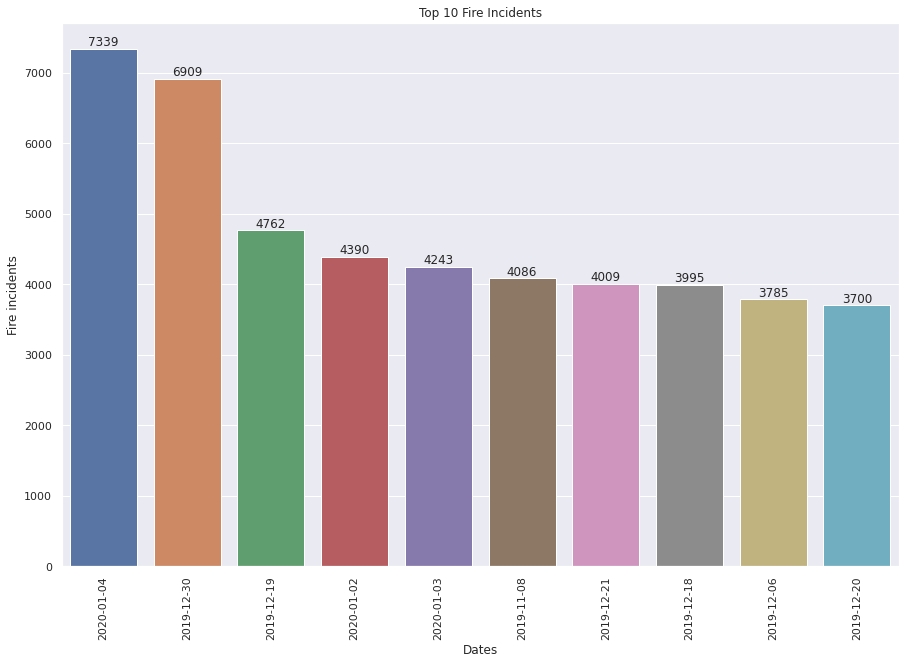

In [35]:
# inspiration for bar chart
# https://stackoverflow.com/questions/43214978/seaborn-barplot-displaying-values/68323374#68323374

# Picking only type 0 = vegetation fire
bushfire_data = df.loc[df["type"] == 0]

# Aggregating incidents by the acquisition date
x = bushfire_data["acq_date"].value_counts()


bushfire_counts = x[:10]


plt.figure(figsize=(15,10))
sns.set(font_scale = 1)
ax = sns.barplot(x="Dates", y="Fire incidents", data=pd.DataFrame(list(zip(x.index[0:10], bushfire_counts)), columns=["Dates", "Fire incidents"]))
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('Top 10 Fire Incidents')
plt.show()

<p style="font-size:18px">Here we have shown the top 10 number of days on which the satelite had recorded the highest number of incidents.
On 4th of January 2020 satellite has recorded 7339 number of incidents.</p>

### 1.3.b Based on the data quality report, which attributes do you think are useful to predict the confidence of an  incident? Explain why you think that the selected attribute is important.

* <p style="font-size:18px">Based on the heatmap correlation plot, we can see that the confidence feature is correlated with the FRP(0.58).</p>
* <p style="font-size:18px">Also, brightness and brightness_t31 are loosely correlated. So, we think that there should a relationship between these features.</p>
* <p style="font-size:18px">Hence, the confidence of an incident should be dependent upon these features(brightness, FRP, and brightness_t31).</p>

# 2. Spatio-temporal data

### 2.1 Plot a geographical heat map of FRP for the Aqua area. Use data from the year 2017 and any aggregation method (e.g. mean, summation, maximum, or something else) of your choice. Justify your choice of aggregation method.

In [36]:
# Filter dataset for the year 2017 only for the Aqua satellite¶
df_aqua_2017 = df_2017[df_2017.satellite == 'Aqua']

# Choose only latitute longitude and FRP columns
df_aqua_2017 = df_aqua_2017[['latitude', 'longitude', 'frp']]

# Group by the coordinate and calculate mean value for the FRP
df_aqua_2017.groupby(['latitude', 'longitude']).mean()
df_aqua_2017.head()

,latitude,longitude,frp
35,-31.43490,151.87030,40.20000
36,-29.25750,152.99950,21.20000
37,-29.25600,153.01190,16.40000
38,-27.32900,149.99160,59.90000
39,-27.31560,150.00730,59.80000


<h3>Aggregation Method</h3>
<p style="font-size:18px">There are plenty of ways to interpret this information. For example, the max value will show the maximum recorded FRP for a particular coordinate. However, we choose to go with the "MEAN" of the FRP to analyze the average FRP during the selected period (which is 2017 in our case). The mean aggregation will give us an idea of the overall picture of the most affected region throughout the year <a href="#1">[1]</a>. <p>

In [37]:
# Re-scale FRP column for satisfying folium requirement
a = df_aqua_2017["frp"]
norm_a = (a - a.min())/(a.max() - a.min())
df_aqua_2017["frp_norm"] = norm_a
df_aqua_2017.drop('frp', axis=1, inplace=True)
df_aqua_2017.head()

,latitude,longitude,frp_norm
35,-31.43490,151.87030,0.00543
36,-29.25750,152.99950,0.00286
37,-29.25600,153.01190,0.00222
38,-27.32900,149.99160,0.00809
39,-27.31560,150.00730,0.00808


In [38]:
# Plotting geographical heatmap using folium
mapObj = folium.Map(location=[df_aqua_2017["latitude"].mean(), df_aqua_2017["longitude"].mean()], zoom_start=5)

HeatMap(df_aqua_2017).add_to(mapObj)
mapObj

<p style="font-size: 18px; color: red">To visualize the map, please run the notebook</p>

<p style="font-size: 18px">To see the detailed map, zoom in on the map</p>

## 2.2. Mark the “Fire activity” (lat, long = -35.6,149.12) on the city map.

<p style="font-size: 18px">Get all coordinates for the given latitude</p>

In [39]:
df[df["latitude"] == -35.6]

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,confidence,version,bright_t31,frp,daynight,type,year,month
812748,-35.60000,150.18980,365.10000,1.30000,1.10000,2019-12-02,2349,Terra,100,6.03000,304.00000,137.60000,D,0,2019,12
815719,-35.60000,150.17990,355.00000,1.80000,1.30000,2019-12-04,32,Terra,87,6.03000,287.80000,165.70000,D,0,2019,12
818540,-35.60000,150.18920,340.80000,1.00000,1.00000,2019-12-05,352,Aqua,72,6.03000,291.40000,35.20000,D,0,2019,12
873383,-35.60000,150.01710,320.50000,2.30000,1.50000,2019-12-27,38,Terra,24,6.03000,296.20000,41.10000,D,0,2019,12
893743,-35.60000,148.19210,318.80000,1.00000,1.00000,2020-01-01,1259,Terra,29,6.03000,289.70000,15.00000,N,0,2020,1
924101,-35.60000,148.97720,333.60000,1.00000,1.00000,2020-01-27,1513,Aqua,100,6.03000,293.70000,31.20000,N,0,2020,1


<p style="font-size: 18px">Find the closest location for the given coordinate difference between longitude value 149.12 and all the other values available</p>

In [40]:
df[df["latitude"] == -35.6]["longitude"].apply(lambda x: abs(x - 149.12))

812748   1.06980
815719   1.05990
818540   1.06920
873383   0.89710
893743   0.92790
924101   0.14280
Name: longitude, dtype: float64

In [41]:
# Mark the activity using folium
from folium.features import DivIcon

mapObj = folium.Map(location=[-35.6, 148.97], zoom_start=10)

folium.Marker([-35.6, 148.97]).add_to(mapObj)
mapObj

<p style="font-size: 18px; color: red">To visualize the map, please run the notebook</p>


## 2.3 Mark the regions with the highest recorded fire radiation in a day for measurements where "acq_date = 2020-01-08".

In [42]:
# Get the max radiation for the given date
location = df.loc[df["frp"] == df[df["acq_date"] == datetime.datetime(2020, 1, 8).date()]["frp"].max()]

# Mark it on the map using folium
mapObj = folium.Map(location=[location["latitude"], location["longitude"]], zoom_start=5)

folium.Marker([location["latitude"], location["longitude"]]).add_child(folium.Popup('Highest Recorded FRP for 01-08-2020')).add_to(mapObj)
mapObj

<p style="font-size: 18px; color: red">To visualize the map, please run the notebook</p>

## 2.4 Find a visualization to plot the progress of the fire activity across all points from Nov 1, 2019, to Jan 31, 2020

<p style="font-size: 18px">Data is filtered between 1st November 2019 to 31st january 2020. It's only the type = 0 incidents <a href="#1">[1]</a>.</p>

In [43]:
mask = ((df["acq_date"] >= datetime.datetime(2019, 11, 1).date()) & (df["acq_date"] <= datetime.datetime(2020, 1, 31).date()))
nav_jan_data = df.loc[mask]
nav_jan_data = nav_jan_data[nav_jan_data["type"] == 0]

In [44]:
map = folium.Map(location=[nav_jan_data["latitude"].mean(), nav_jan_data["longitude"].mean()], zoom_start=5, control_scale=True)

In [45]:
# The data is grouped by date 

lat_long_list = []
group_index = []
for index, group in nav_jan_data.groupby("acq_date"):
    temp = []
    group_index.append(str(index))
    for lat, long, frp in zip(group["latitude"],group["longitude"], group["frp"]):
        temp.append([lat, long, frp])
    lat_long_list.append(temp)

In [46]:
# HeatMap with time

timeslider = plugins.HeatMapWithTime(lat_long_list, index=group_index).add_to(map)
map

<p style="font-size: 18px; color: red">To visualize the map, please run the notebook</p>

# 3. Build a model for spatial prediction of wildfire

### 3.1. In between ‘Brightness temperature I-5’ and ‘Fire Radiative Power’ choose either as the target feature.

<p style="font-size: 18px">We are choosing brightness as our target variable because it is correlated with confidence and FRP. The confidence variable shows the probability of bush fire in that particular region. And as brightness is a continuous variable, we want to do a regression task on this data. We are using brightness because it is a good indicator of a bush fire.</p>

### 3.2. Explain what the task you’re solving is (e.g., supervised x unsupervised, classification x regression x clustering or similarity matching x, etc)
<p style="font-size: 18px">Since we already know the target variable, this is a supervised learning problem. Both the given target variables (FRP and brightness) are continuous. Hence, a regression model is the most suitable model to predict the target variable. We are performing regression to find out the brightness for indicating whether that region is going to be affected by a bush fire.</p> 

### 3.3. Use a feature selection method to select the features to build a model.

In [47]:
# Separate input features and the selected target variable
# Output variable
Y = sampled_df['brightness']
# Input variable
X = sampled_df.drop(['brightness'], axis=1)

In [48]:
# Use select K best method to get the best features to predict the output variable
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression


selector = SelectKBest(mutual_info_regression, k=4)
selector.fit_transform(X, Y)
# Get columns to keep and create new dataframe with those only
cols = selector.get_support(indices=True)
X_new = X.iloc[:,cols]
X_new.head()

,acq_time,confidence,bright_t31,frp
438,1517,9,293.30000,4.20000
115,454,62,305.20000,66.50000
482,324,74,300.00000,28.20000
1521,1439,93,294.00000,14.70000
222,348,96,296.40000,58.30000


In [49]:
X_new = X_new.astype('float64')

## 4. Select one or more evaluation metrics. Justify your choice.
<p style="font-size:18px">There are plenty of evaluation metrics available for regression tasks. For example,</p>
<p style="font-size:18px; font-weight: bold">1. Mean absolute error(MAE)</p>
<Img style="height: 100px" src="https://miro.medium.com/max/1040/1*tu6FSDz_FhQbR3UHQIaZNg.png" /> 
<p style="font-size:18px">We take absolute difference between actual value and predicted value and take a mean by summing all N values and later on dividing it by N. This metrics is very basic and it shows a direct representation of the total error.</p>
<p style="font-size:18px; font-weight: bold">2. Mean Squared error (MSE) </p>
<Img style="height: 100px" src="https://miro.medium.com/max/1136/1*aFBAjR7kzWirbqORnYa43Q.png" />
<p style="font-size:18px">Instead of taking a absolute difference into consideration, we do square of the difference and add all the N differences and divide that sum with N. This way the larger differences (Wrong Predictions) will have more contribution in the total MSE. But one of the disadvantages of MSE is it's affected by scaling <a href="#a">[a]</a>. The MSE is different when you do scale your big feature (e.g house price in 100s of thounds) between 0 to 1.</p>
<p style="font-size:18px; font-weight: bold">3. R Square</p>
<Img style="height: 100px" src="https://miro.medium.com/max/1400/1*e1n9VlEFgaJWLKyaJQZwlw.png" />
<p style="font-size:18px">R Square is calculated by the sum of squared of prediction error divided by the total sum of the square which replaces the calculated prediction with mean. R Square measures how much variability in dependent variable can be explained by the model. Also, the R Square value lies between 0 to 1, so we can show it in terms of percentage of variablity explained by the model <a href="#8">[8]</a>.</p>
<p style="font-size:18px">We would like to choose R square as our evaluation metrics for this regression task. It gives a good idea about the variability explained (in percentage) by the trained model. It's not affected by feature scaling as well <a href="#5">[5]</a>.</p>

## 5. Build a baseline model

<p style="font-size:18px">KNN algorithm is used in classification and regression problems. This algorithm works on the "feature similarity" to predict the new datapoint's value. In other words, it assigns value based on how closely it resembles the points in the training set. Here we have data with geo-temporal features like latitude, longitude, acquisition date, etc. Therefore, we have hypothesized that using the KNN regressor might be a good baseline model choice for the data <a href="#3">[3]</a>.</p>

In [50]:
# here we are split the data into training (80%) and testing (20%) sets.
X_new = X_new.astype("float64")
train_X, test_X, train_y, test_y = train_test_split(X_new, Y, test_size = 0.2, random_state = 123)

In [51]:
# KNN Regressor
# Initially we have taken n_neighbors = 5
neigh = KNeighborsRegressor(n_neighbors=5)
neigh.fit(train_X, train_y)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                    weights='uniform')

In [52]:
# Predict the model
pred = neigh.predict(test_X)
# MAE, RMSE, R2 Computation
mae = MAE(test_y, pred)
rmse = np.sqrt(MSE(test_y, pred))
rsquare = R2(test_y, pred)
print("MAE : % f" %(mae))
print("RMSE : % f" %(rmse))
print("R-Square : % f" %(rsquare))

MAE :  4.314699
RMSE :  7.149864
R-Square :  0.893868


<p style="font-size:18px">With an arbitary selection of k=5 our model is getting 89% R square value, which means the trained model is able to explain 89% of the variance in the testing data. But in order to find an optimal value of k we will run a loop over it and check the R Square. </p>

<p style="font-size:18px">
<b>What are you doing to avoid overfitting?</b>
<br>
In KNN based approach, the important hyperparameter is the value of k. If we use a small k (Example 1 or 2), the model will overfit to its nearest similar data points. At the same time, if we use the big value of k, it will under-fit the model. Here, we have changed the value of k over a range of 20 with increment of 1. We have tried to find an optimal value of k for which the model is giving least error on validation (here it's the testing data) dataset.
</p>

In [53]:
# model training function for KNN regressor
def knn_train_model(n):
    model = KNeighborsRegressor(n_neighbors=n)
    model.fit(train_X, train_y)
    return model

# prediction function
def knn_prediction(model, X):
    # Predict the model
    pred = model.predict(X)
    return pred

r2_train = []
r2_test = []

# Training on KNeighborsRegressor over range(1,20) n_neighbors
# Testing the model prediction on training and testing data
for i in tqdm(range(1, 20)):
    model = knn_train_model(i)
    train_pred = knn_prediction(model, train_X)
    test_pred = knn_prediction(model, test_X)
    r2_train.append(R2(train_y, train_pred))
    r2_test.append(R2(test_y, test_pred))

100%|██████████| 19/19 [00:44<00:00,  2.36s/it]


<p style="font-size:18px"><b>Visualization of the training process</b></p>

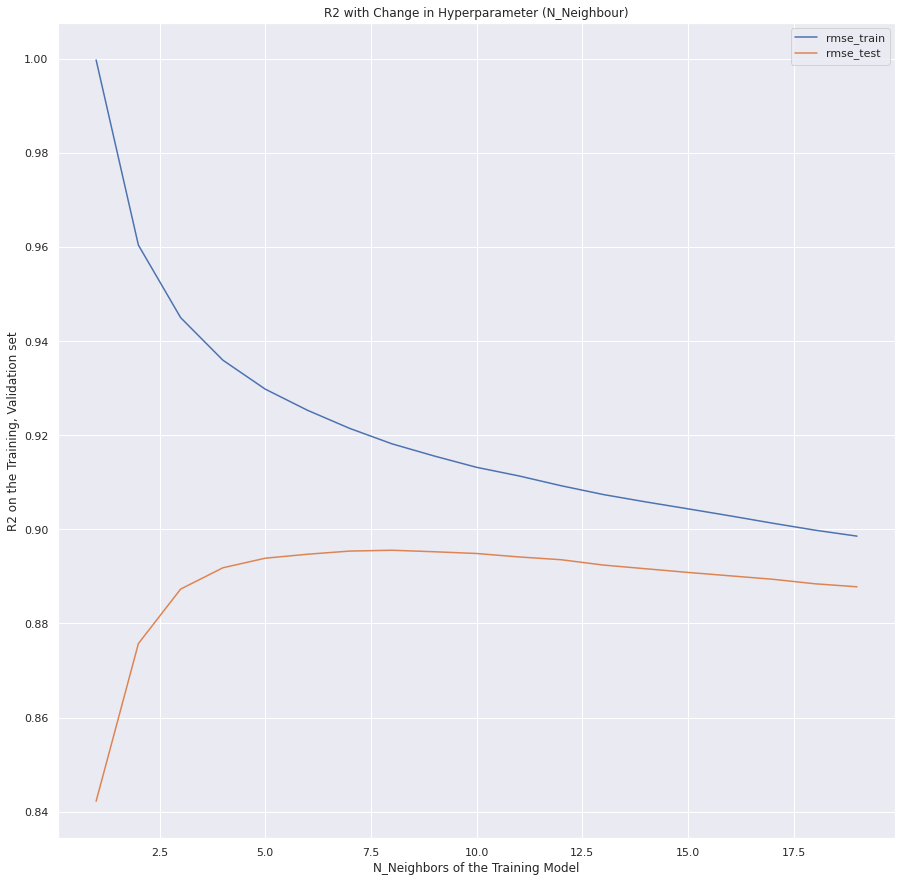

In [54]:
plt.plot(range(1, 20), r2_train, label='rmse_train')
plt.plot(range(1, 20), r2_test, label='rmse_test')
plt.legend(loc='upper right')
plt.xlabel("N_Neighbors of the Training Model")
plt.ylabel("R2 on the Training, Validation set")
plt.title("R2 with Change in Hyperparameter (N_Neighbour)")
plt.show()

<p style="font-size:18px">We can see that with change in the value of n_neighbors hyperparameter the evaluation metrics (R2) is decreasing on trianing data, but on the validation data the R2 increased till n_neighbours = 6 and then after it started to decrease again. This graph shows that the n_neighbours = 6 is the best hyperparameter value for our dataset. Using values above 6 will overfit the model.</p>

In [55]:
knn_final = KNeighborsRegressor(n_neighbors=6)
knn_final.fit(train_X, train_y)

# Predict the model
knn_final_prediction = neigh.predict(test_X)

knn_rsquare = R2(test_y, knn_final_prediction)

print("R-Square for final KNN regressor model: % f" %(knn_rsquare))

R-Square for final KNN regressor model:  0.893868


## 6. Build a candidate final model ( you are encouraged to experiment with more that one model but only include and discuss your “best” model)

<p style="font-size: 18px">We all know that gradient boosting is one of the most powerful algorithms for classification and regression problems except the neural networks. It works on the hypothesis that the next best possible model combined with previous models will give the least prediction error. XGBoost is also an ensemble learning-based gradient boosting algorithm that works on the same philosophy.
Here we are hypothesizing that it will perform well with the geo-temporal data <a href="#4">[4]</a>. </p>

In [56]:
# XGB
# Initialy we have choose random hyperparameter values for the XGB regressor
# n_estimators is the max number of weak learners 
# max_depth is the Xgb tree depth / level
# eta is the learning rate
xgb_r = xg.XGBRegressor(n_estimators = 35, seed = 123, max_depth=10, eta=0.25)

In [57]:
# model training
eval_set=[(test_X, test_y)]
xgb_r.fit(train_X, train_y, eval_set=eval_set)

[0]	validation_0-rmse:248.67076
[1]	validation_0-rmse:186.59267
[2]	validation_0-rmse:140.04273
[3]	validation_0-rmse:105.14209
[4]	validation_0-rmse:78.98799
[5]	validation_0-rmse:59.39557
[6]	validation_0-rmse:44.74182
[7]	validation_0-rmse:33.80644
[8]	validation_0-rmse:25.67484
[9]	validation_0-rmse:19.66708
[10]	validation_0-rmse:15.26980
[11]	validation_0-rmse:12.10150
[12]	validation_0-rmse:9.87303
[13]	validation_0-rmse:8.34702
[14]	validation_0-rmse:7.35148
[15]	validation_0-rmse:6.72287
[16]	validation_0-rmse:6.32943
[17]	validation_0-rmse:6.09999
[18]	validation_0-rmse:5.95346
[19]	validation_0-rmse:5.87070
[20]	validation_0-rmse:5.82082
[21]	validation_0-rmse:5.79152
[22]	validation_0-rmse:5.76462
[23]	validation_0-rmse:5.75737
[24]	validation_0-rmse:5.75175
[25]	validation_0-rmse:5.74947
[26]	validation_0-rmse:5.74915
[27]	validation_0-rmse:5.73333
[28]	validation_0-rmse:5.72122
[29]	validation_0-rmse:5.71618
[30]	validation_0-rmse:5.71115
[31]	validation_0-rmse:5.71505
[3

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False, eta=0.25,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.25, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=10, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=35, n_jobs=0,
             num_parallel_tree=1, objective='reg:squarederror',
             predictor='auto', random_state=123, ...)

<p style="font-size:18px;color:red;">Note: Here model evaluation is measured by RMSE.</p>

In [58]:
pred = xgb_r.predict(test_X)
# MAE, RMSE, RSquare Computation
mae = MAE(test_y, pred)
rmse = np.sqrt(MSE(test_y, pred))
r2 = R2(test_y, pred)
print("MAE : % f" %(mae))
print("RMSE: % f" %(rmse))
print("R2 : % f" %(r2))

MAE :  3.623770
RMSE:  5.705777
R2 :  0.932410


<p style="font-size:18px">With an arbitary selection of n_estimators=35, max_depth=10 and learning_rate (eta) is 0.25. Our model is getting 93% R square value, which means the trained model is able to explain 93% of the variance in the target variable. But in order to find an optimal value of n_estimators we will run a loop over it and check the R Square. </p>

<p style="font-size:18px"><b>Visualization the distribution of actual and predicted data</b></p>

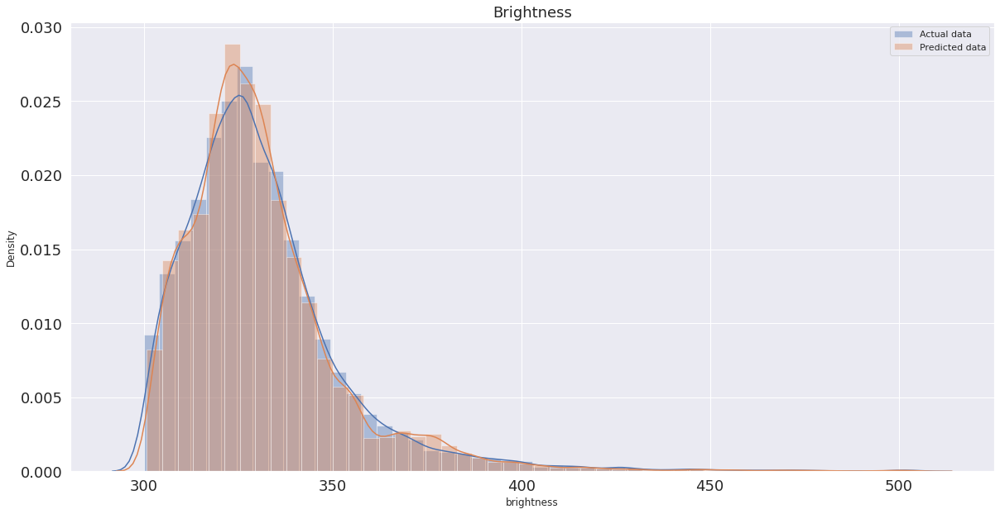

In [59]:
sns.set(rc ={'figure.figsize':(20,10)})
sns.distplot(test_y, label="Actual data")
sns.distplot(pd.Series(pred), label="Predicted data")
plt.legend()
plt.title('Brightness', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()

<p style="font-size:18px">Here, we have tried to plot the last trained estimator after training is completed. Both the distributions are very similar. </p>

In [60]:
# Training on XGB Regressor
def xgb_train_model(n):
    model = xg.XGBRegressor(objective ='reg:linear',n_estimators = n, seed = 123, max_depth=10, verbosity = 0)
    model.fit(train_X, train_y)
    return model

# Prediction model
def xgb_prediction(model, X):   
    pred = model.predict(X)
    return pred


r2_train = []
r2_test = []

for i in tqdm(range(10, 50, 2)):
    model = xgb_train_model(i)
    train_pred = xgb_prediction(model, train_X)
    test_pred = xgb_prediction(model, test_X)
    r2_train.append(R2(train_y, train_pred))
    r2_test.append(R2(test_y, test_pred))

100%|██████████| 20/20 [00:37<00:00,  1.86s/it]


<p style="font-size:18px"><b>Visualization of the training process</b></p>

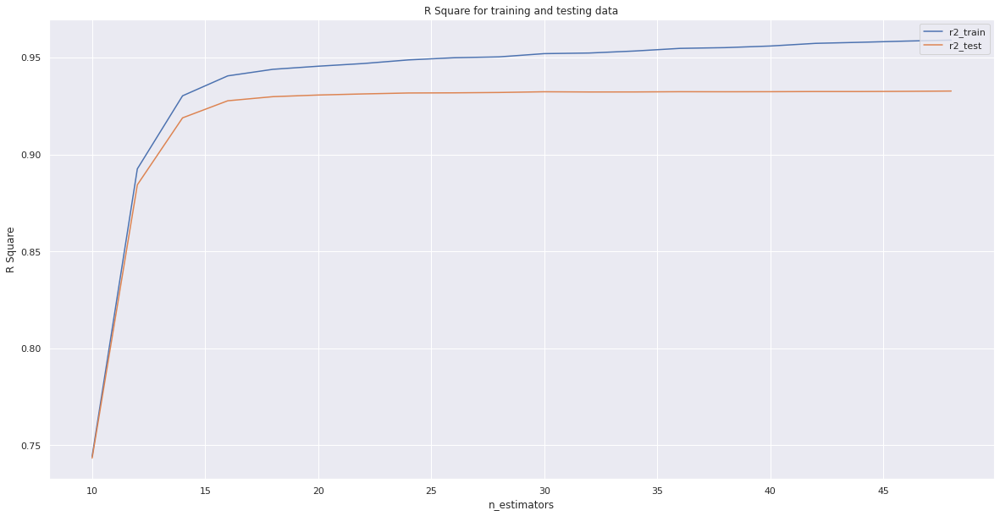

In [61]:
plt.plot(range(10, 50, 2), r2_train, label='r2_train')
plt.plot(range(10, 50, 2), r2_test, label='r2_test')
plt.legend(loc='upper right')
plt.xlabel("n_estimators")
plt.ylabel("R Square")
plt.title("R Square for training and testing data")
plt.show()

<p style="font-size:18px">We can observe that after around n_estimators = 20 our models validation/testing score is not increasing. It shows that the model might be overfitting on the training data. We can choose n_estimators = 20 as the best hyperparameter for our model.</p>

In [62]:
xgb_model = xg.XGBRegressor(objective ='reg:linear',n_estimators = 20, seed = 123, max_depth=10, verbosity = 0)
xgb_r.fit(train_X, train_y)

xgb_final_prediction = xgb_r.predict(test_X)

xgb_rsquare = R2(test_y, xgb_final_prediction)

print("R-Square for final XGB regressor model: % f" %(xgb_rsquare))

R-Square for final XGB regressor model:  0.932410


## 7. Compare the two models with a statistical significance test. Use a box plot to visualize your comparison.

<p style="font-size:18px">Here, our null hypothesis will be there is no statistical differece between both model (KNN Regressor, XGB Regressor) predictions.</p>

In [63]:
scipy.stats.ttest_ind(knn_final_prediction, xgb_final_prediction)

Ttest_indResult(statistic=-0.57601620581761, pvalue=0.5646063377124586)

<p style="font-size:18px">Here the higher pvalue indicates that the statistical test between two distributions is insignificant and we can accept the null hypothesis.</p>

In [64]:
final_predictions = pd.DataFrame({'knn_prediction': knn_final_prediction, 'xgb_prediction': xgb_final_prediction})
final_predictions.reset_index(drop=True, inplace=True)

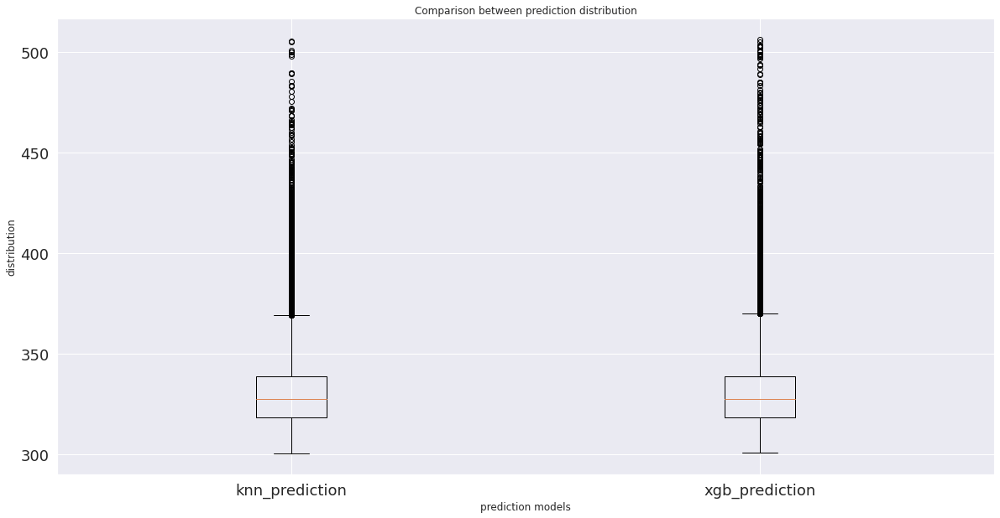

In [65]:
fig1, ax1 = plt.subplots()
ax1.set_title('Basic Plot')
ax1.boxplot(final_predictions)
plt.xticks([1, 2], ['knn_prediction','xgb_prediction'])
plt.xlabel("prediction models")
plt.ylabel("distribution")
plt.title("Comparison between prediction distribution")
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()

<p style="font-size:18px">We can see very similar prediction distribution for both the final models for KNN Regressor and XGB Regressor. As our final R square errors for both the models were 0.89 and 0.93 and difference is not so big, respectively we were expecting the prediction distribution to be similar.</p>

## References
[1] <a id="1" href="https://python-visualization.github.io/folium/">https://python-visualization.github.io/folium/ </a><br />
[2] <a id="2" href="https://stackoverflow.com/questions/43214978/seaborn-barplot-displaying-values/68323374">https://stackoverflow.com/questions/43214978/seaborn-barplot-displaying-values/68323374</a><br />
[3] <a id="3" href="https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsRegressor.html">https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsRegressor.html</a> <br />
[4] <a id="4" href="https://www.datatechnotes.com/2019/06/regression-example-with-xgbregressor-in.html">https://www.datatechnotes.com/2019/06/regression-example-with-xgbregressor-in.html</a> <br />
[5] <a id="5" href="https://towardsdatascience.com/what-are-the-best-metrics-to-evaluate-your-regression-model-418ca481755b"> https://towardsdatascience.com/what-are-the-best-metrics-to-evaluate-your-regression-model-418ca481755b </a> <br />
[6] <a id="6" href="https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.KFold.html"> https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.KFold.html </a><br />
[7] <a id="7" href="https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.mutual_info_regression.html"> https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.mutual_info_regression.html </a><br />
[8] <a id="8" href="https://vitalflux.com/mean-square-error-r-squared-which-one-to-use/"> https://vitalflux.com/mean-square-error-r-squared-which-one-to-use/ </a>